In [1]:
from scipy.io import readsav
import cdflib
import pyspedas
from pyspedas import time_string, time_double, tinterpol
import pytplot
from pytplot import tplot, store_data, get_data ,tlimit,xlim,ylim,tplot_options,options,split_vec,cdf_to_tplot,divide,tplot_names,get_timespan, tplot_rename, time_datetime
#import wget
from warnings import simplefilter 
simplefilter(action='ignore', category=DeprecationWarning)
import cdflib
from datetime import datetime,timedelta
import os.path
import bisect
import csv
from scipy import interpolate
import pandas as pd
import astropy.units as u,astropy.constants as const

#%matplotlib notebook
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
#import math functions 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors
import dateutil.parser

from matplotlib import ticker, cm
import warnings 
warnings.filterwarnings("ignore")


from warnings import simplefilter 
simplefilter(action='ignore', category=DeprecationWarning)

In [3]:
date = '2021-11-25'
df_sf00 = pd.read_csv('spp_swp_spi_sf00_' + date + '.csv')
filtered_val_index_sf00 = np.where((df_sf00['np1'] > 10) & (df_sf00['np2'] > 10) & (df_sf00['Tperp1'] > .01) & (df_sf00['Tperp2'] > .01) & (df_sf00['Trat1'] > .01) & (df_sf00['Trat2'] > .01) & (df_sf00['Trat1'] != 30)  & (df_sf00['Trat2'] != 30) & (df_sf00['Trat1'] != 2.0) & (df_sf00['Trat2'] != 2.0) & (df_sf00['vdrift'] != 10000) & (df_sf00['vdrift'] != -10000)& (df_sf00['vp1_x'] != 10000) & (df_sf00['vp1_x'] != -10000))
df_sf00 = df_sf00.iloc[filtered_val_index_sf00]
df_sf00['datetime'] = [datetime.utcfromtimestamp(t) for t in df_sf00.time]
#print(csvFile_sf00.head(0))

In [4]:

trange=['2021-11-25/00:00','2021-11-26/00:00']

#specify span-i data type to plot
spi_datatype='spi_sf00_l3_mom' #protons
spi_vars = pyspedas.psp.spi(trange=trange, datatype=spi_datatype, level='l3', time_clip=True)

spe_datatype = 'spe_sf0_pad' #electrons
spe_vars = pyspedas.psp.spe(trange=trange, datatype=spe_datatype, level='l3', time_clip=True,get_support_data=True)

mag_datatype = 'mag_rtn_4_sa_per_cyc' #mag
mag_vars = pyspedas.psp.fields(trange=trange, datatype=mag_datatype, level='l2', time_clip=True)

#Download QTN for "most reliable density measurement"
qtn_datatype = 'sqtn_rfs_V1V2' #sqtn
qtn_vars = pyspedas.psp.fields(trange=trange, datatype=qtn_datatype, level='l3', time_clip=True,get_support_data=True)

16-May-24 20:22:39: Downloading remote index: https://spdf.gsfc.nasa.gov/pub/data/psp/sweap/spi/l3/spi_sf00_l3_mom/2021/
16-May-24 20:22:40: Downloading https://spdf.gsfc.nasa.gov/pub/data/psp/sweap/spi/l3/spi_sf00_l3_mom/2021/psp_swp_spi_sf00_l3_mom_20211125_v04.cdf to psp_data/sweap/spi/l3/spi_sf00_l3_mom/2021/psp_swp_spi_sf00_l3_mom_20211125_v04.cdf
16-May-24 20:22:40: Download complete: psp_data/sweap/spi/l3/spi_sf00_l3_mom/2021/psp_swp_spi_sf00_l3_mom_20211125_v04.cdf
16-May-24 20:22:40: Time clip returns full data set.
16-May-24 20:22:40: Time clip returns full data set.
16-May-24 20:22:40: Time clip returns full data set.
16-May-24 20:22:40: Time clip returns full data set.
16-May-24 20:22:40: Time clip returns full data set.
16-May-24 20:22:40: Time clip returns full data set.
16-May-24 20:22:40: Time clip returns full data set.
16-May-24 20:22:40: Time clip returns full data set.
16-May-24 20:22:40: Time clip returns full data set.
16-May-24 20:22:40: Time clip returns full da

Using LEVEL=L3


16-May-24 20:22:43: Time clip returns full data set.
16-May-24 20:22:43: Time clip returns full data set.
16-May-24 20:22:43: Time clip returns full data set.


In [5]:
def resample(data, times, new_times):
    ###interpolate data to times from data2
    interpol_f = interpolate.interp1d(times, data,fill_value="extrapolate")
    new_data1 = interpol_f(new_times)    
    return new_times, new_data1

In [6]:
#Access electron strahl pitch-angle distribution (PAD)
epad_data=get_data('psp_spe_EFLUX_VS_PA_E')
epad_PA = get_data('psp_spe_PITCHANGLE')

epad_times=epad_data.times
epad_vals = epad_data.y
epad_PA_vals = epad_PA.y

#Note for E1-E9, electron strahl energy bin is 8, for E10 and above, it's 12
energy_index = 12
epad_strahl = epad_vals[:,:,energy_index]

datetime_spe = time_datetime(epad_times)
times_spe_repeat = np.repeat(np.expand_dims(datetime_spe,1),12,1)

#compute centroids
centroids_epad = np.ma.average(epad_PA_vals, 
                       weights=epad_strahl, 
                       axis=1)
#interpolate to sf00 cadence
estrahl_pad_centroid_spi_t, estrahl_pad_centroid_spi_ds = resample(centroids_epad, epad_times, df_sf00['time'])
#append to sf00 dataframe
df_sf00['estrahl_pad_centroid'] = estrahl_pad_centroid_spi_ds
#access proton energy flux vs energy
spi_eflux_v_energy = get_data('psp_spi_EFLUX_VS_ENERGY')

spi_times = spi_eflux_v_energy.times
spi_nrg_flux = spi_eflux_v_energy.y
spi_nrg_vals = spi_eflux_v_energy.v

datetime_spi = time_datetime(spi_times)
times_spi_repeat = np.repeat(np.expand_dims(datetime_spi,1),32,1)

#Access components of magentic field
split_vec('psp_fld_l2_mag_RTN_4_Sa_per_Cyc')
br = get_data('psp_fld_l2_mag_RTN_4_Sa_per_Cyc_x')
bt = get_data('psp_fld_l2_mag_RTN_4_Sa_per_Cyc_y')
bn = get_data('psp_fld_l2_mag_RTN_4_Sa_per_Cyc_z')
bmag_rtn4sa = np.sqrt(br.y**2 + bt.y **2 + bn.y**2)


In [7]:
#Access data from qtn tplot vars
ne = get_data('electron_density')
te = get_data('electron_core_temperature')
#interpolate electron density and temperature to sf00 cadence
qtn_spi_t, ne_spi_up = resample(ne.y, ne.times, df_sf00.time)
qtn_spi_t, te_spi_up = resample(te.y, te.times, df_sf00.time)
#append to dataframe
df_sf00['n_e'] = ne_spi_up
df_sf00['t_e'] = te_spi_up

In [8]:
#calculate variables
df_sf00['vp1_mag'] = np.sqrt(df_sf00['vp1_x']**2 + df_sf00['vp1_y']**2 + df_sf00['vp1_z']**2)
df_sf00['B_mag'] = np.sqrt(df_sf00['B_inst_x']**2 + df_sf00['B_inst_y']**2 + df_sf00['B_inst_z']**2)
df_sf00['bhat_x'] = df_sf00['B_inst_x']/df_sf00['B_mag']
df_sf00['bhat_y'] = df_sf00['B_inst_y']/df_sf00['B_mag']
df_sf00['bhat_z'] = df_sf00['B_inst_z']/df_sf00['B_mag']

m = 1836 * 511000.0 / (299792.0**2) #proton mass
df_sf00['n_tot'] = df_sf00['np1'] + df_sf00['np2']
df_sf00['Tperp_tot'] = (df_sf00['np1'] * df_sf00['Tperp1'] + df_sf00['np2'] * df_sf00['Tperp2'])/df_sf00['n_tot']
df_sf00['Tpar1'] = df_sf00['Tperp1']/df_sf00['Trat1']
df_sf00['Tpar2'] = df_sf00['Tperp2']/df_sf00['Trat2']
df_sf00['Tpar_tot'] = (df_sf00['np1'] * df_sf00['Tpar1'] + df_sf00['np2'] * df_sf00['Tpar2'] + (df_sf00['np1'] * df_sf00['np2'] / df_sf00['n_tot'])* m * (df_sf00['vdrift']**2))/df_sf00['n_tot'] 
df_sf00['Trat_tot'] = df_sf00['Tperp_tot']/df_sf00['Tpar_tot']

df_sf00['vcm_x'] = df_sf00['vp1_x'] + df_sf00['np1']/df_sf00['np2'] * df_sf00['vdrift'] * df_sf00['bhat_x'] # fitted center of mass velocity (x)
df_sf00['vcm_y'] = df_sf00['vp1_y'] + df_sf00['np1']/df_sf00['np2'] * df_sf00['vdrift'] * df_sf00['bhat_y'] # fitted center of mass velocity (y)
df_sf00['vcm_z'] = df_sf00['vp1_z'] + df_sf00['np1']/df_sf00['np2'] * df_sf00['vdrift'] * df_sf00['bhat_z'] # fitted center of mass velocity (z)
df_sf00['vcm_mag'] = np.sqrt(df_sf00['vcm_x']**2 + df_sf00['vcm_y']**2 + df_sf00['vcm_y']**2)

#compute heat flux
m = 1836 * 511000.0 / (299792.0**2)

#convert to thermal speeds
vt1perp2 = 2 * df_sf00['Tperp1']/m 
vt2perp2 = 2 * df_sf00['Tperp2']/m 
vt1par2 = 2 * df_sf00['Tpar1']/m 
vt2par2 = 2 * df_sf00['Tpar2']/m 

fac = 1.602E-10 #W/m2 conversion
df_sf00['qz_p'] = fac * 0.5 * m * ((df_sf00['np1'] * df_sf00['np2']) / df_sf00['n_tot']) * df_sf00['vdrift'] * (1.5 * (vt2par2 - vt1par2) + df_sf00['vdrift']**2 * (df_sf00['np1']**2 - df_sf00['np2']**2)/df_sf00['n_tot']**2 + (vt2perp2 - vt1perp2))
#compute normalisation factors

df_sf00['vt_perp_tot'] = np.sqrt(2 * (df_sf00['np1'] * df_sf00['Tperp1'] + df_sf00['np2'] * df_sf00['Tperp2']) / (m * df_sf00['n_tot']))
df_sf00['vt_par_tot'] = np.sqrt(2 * (df_sf00['np1'] * df_sf00['Tpar1']+ df_sf00['np2'] * df_sf00['Tpar2'] + m * df_sf00['vdrift']**2 * (df_sf00['np1'] * df_sf00['np2'])/df_sf00['n_tot']) / (m * df_sf00['n_tot']))

df_sf00['qz_p_perp']= df_sf00['qz_p'] / (m * df_sf00['n_tot'] * df_sf00['vt_perp_tot']**3)    # also normalise by mass
df_sf00['qz_p_par'] = df_sf00['qz_p'] / (m * df_sf00['n_tot'] * df_sf00['vt_par_tot']**3)


#Compute Alfven Mach number and Proton Parallel, Perp Beta

#calculate Alfven speed
df_sf00['valfven_qtn'] = 21.8 * df_sf00['B_mag']/ np.sqrt(df_sf00['n_e']) #using qtn density
df_sf00['valfven_pfits'] = 21.8 * df_sf00['B_mag']/ np.sqrt(df_sf00['n_tot']) #using proton p1 + p2 total density

#defining center of mass velocity magnitude as |Vsw| compute Vsw mach
df_sf00['Vcm_mach_qtn'] = df_sf00['vcm_mag']/df_sf00['valfven_qtn'] #using valfven from qtn
df_sf00['Vcm_mach_pfits'] = df_sf00['vcm_mag']/df_sf00['valfven_pfits'] #using valfven from fits
#defining p1 velocity magnitude as |Vsw| compute Vsw mach
df_sf00['Vp1_mach_qtn'] = df_sf00['vp1_mag']/df_sf00['valfven_qtn'] #using valfven from qtn
df_sf00['Vp1_mach_pfits'] = df_sf00['vp1_mag']/df_sf00['valfven_pfits'] #using valfven from fits

#compute proton beta 
#note 1e-5 is factor conversion from nT to cgs
df_sf00['beta_ppar_qtn'] = (4.03E-11 * df_sf00['n_e'] * df_sf00['Tpar_tot'])/(1e-5 * df_sf00['B_mag'])**2 #total BetaPar from qtn dens
df_sf00['beta_ppar_pfits'] = (4.03E-11 * df_sf00['n_tot'] * df_sf00['Tpar_tot'])/(1e-5 * df_sf00['B_mag'])**2 #total BetaPar from pfit dens
df_sf00['beta_pperp_qtn'] = (4.03E-11 * df_sf00['n_e'] * df_sf00['Tperp_tot'])/(1e-5 * df_sf00['B_mag'])**2 #total BetaPerp from qtn dens
df_sf00['beta_pperp_pfits'] = (4.03E-11 * df_sf00['n_tot'] * df_sf00['Tperp_tot'])/(1e-5 * df_sf00['B_mag'])**2 #total BetaPar from pfit dens
df_sf00['beta_par_p1'] = (4.03E-11 * df_sf00['np1'] * df_sf00['Tpar1'])/(1e-5 * df_sf00['B_mag'])**2 #proton p1 BetaPar
df_sf00['beta_par_p2'] = (4.03E-11 * df_sf00['np2'] * df_sf00['Tpar2'])/(1e-5 * df_sf00['B_mag'])**2 #proton p2 BetaPar
df_sf00['beta_perp_p1'] = (4.03E-11 * df_sf00['np1'] * df_sf00['Tperp1'])/(1e-5 * df_sf00['B_mag'])**2 #proton p1 BetaPerp
df_sf00['beta_perp_p2'] = (4.03E-11 * df_sf00['np2'] * df_sf00['Tperp2'])/(1e-5 * df_sf00['B_mag'])**2 #proton p2 BetaPerp

df_sf00['beta_p_qtn_tot'] = np.sqrt(df_sf00['beta_ppar_qtn']**2 + df_sf00['beta_pperp_qtn']**2)
df_sf00['beta_p_pfits_tot'] = np.sqrt(df_sf00['beta_ppar_pfits']**2 + df_sf00['beta_pperp_pfits']**2)

#hammerhead diagnostic
df_sf00['ham_param'] = (df_sf00['Tperp2']/df_sf00['Tperp1'])/df_sf00['Trat_tot']


16-May-24 20:55:30: /tmp/ipykernel_1431/1024471272.py:12: RuntimeWarning: divide by zero encountered in log10
  np.log10(spi_nrg_flux),cmap='turbo')

16-May-24 20:55:33: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:33: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:33: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:33: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:33: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:33: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:33: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:33: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:39: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:39: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:39: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:39: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:39: Substituting symbol \perp from STIXGeneral
16-May-24 20:55:39: Substitutin

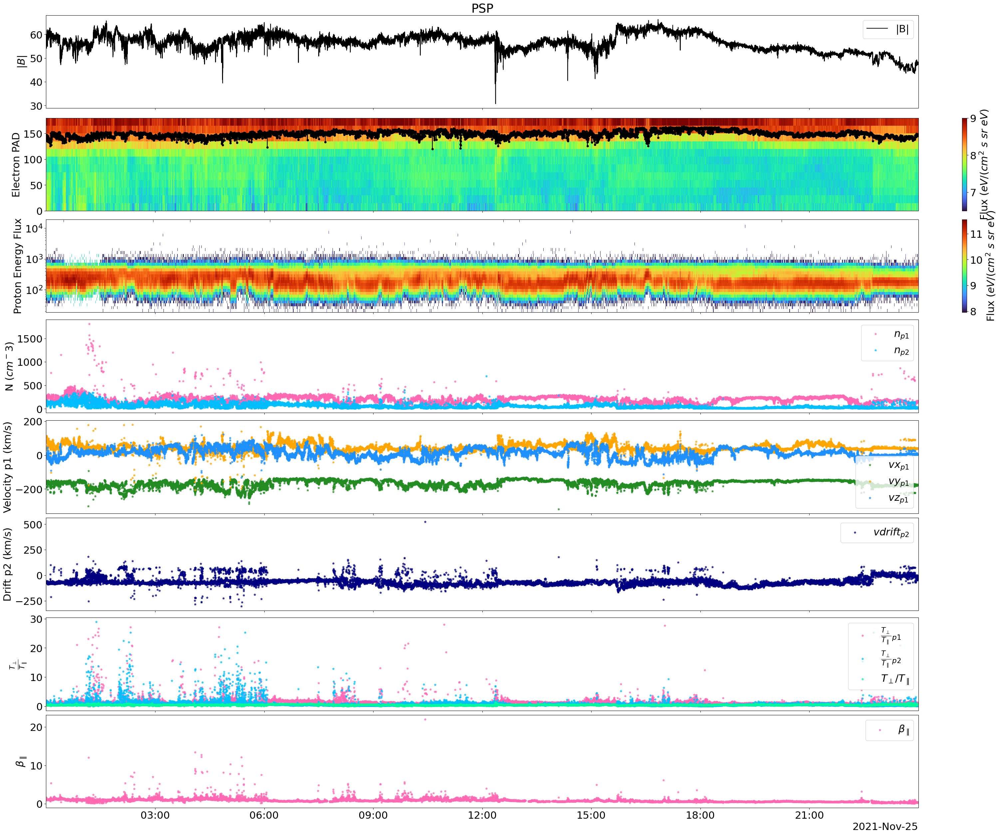

In [21]:
plt.rcParams.update({'font.size': 22})

fig, ax = plt.subplots(8, 1, sharex=True, figsize=(30, 25),layout='compressed')
s=20
alpha=.7
ax[0].plot(time_datetime(br.times),bmag_rtn4sa, label = '|B|', color='k')
s1=ax[1].pcolormesh(times_spe_repeat,epad_PA_vals,
         np.log10(epad_strahl),cmap='turbo', vmin = 6.5, vmax = 9)
cbar = plt.colorbar(s1,label=f'Flux ($eV/(cm^2 \\ s \\ sr \\ eV)$')
ax[1].plot(datetime_spe,centroids_epad,color='black', linestyle='-', marker='o', markersize=4)
s2 = ax[2].pcolormesh(times_spi_repeat,spi_nrg_vals,
         np.log10(spi_nrg_flux),cmap='turbo')
cbar2 = plt.colorbar(s2,label=f'Flux ($eV/(cm^2 \\ s \\ sr \\ eV)$')
ax[3].scatter(df_sf00['datetime'], df_sf00['np1'], label = '$n_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[3].scatter(df_sf00['datetime'], df_sf00['np2'], label = '$n_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[4].scatter(df_sf00['datetime'], df_sf00['vp1_x'], label = '$vx_{p1}$', color = 'forestgreen', marker=(5,1), s=s, alpha=alpha)
ax[4].scatter(df_sf00['datetime'], df_sf00['vp1_y'], label = '$vy_{p1}$', color = 'orange', marker=(5,1), s=s, alpha=alpha)
ax[4].scatter(df_sf00['datetime'], df_sf00['vp1_z'], label = '$vz_{p1}$', color = 'dodgerblue', marker=(5,1), s=s, alpha=alpha)
ax[5].scatter(df_sf00['datetime'], df_sf00['vdrift'], label = '$vdrift_{p2}$', color = 'navy', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['Trat1'], label = r'$\frac{T_\perp}{T_\parallel}_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['Trat2'], label = r'$\frac{T_\perp}{T_\parallel}_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['Trat_tot'], label = r'$T_\perp/T_\parallel$', color = 'mediumspringgreen', marker=(5,1), s=s, alpha=alpha)
ax[7].scatter(df_sf00['datetime'], df_sf00['beta_ppar_qtn'], label = r'$\beta_\parallel$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)

ax[0].set(
    title=f'PSP',
    ylabel=f'$|B|$',
   # xlim = [datetime(2023, 9, 27, 12,0,0), datetime(2023, 9, 27, 23,0,0)]

)
ax[1].set(
    ylabel = f'Electron PAD'
    #ylim = [-500,500]
)
ax[2].set(
    ylabel = 'Proton Energy Flux',
 #   ylim = [10,3e4]
)
ax[2].set_yscale('log')

ax[3].set(
    ylabel=f'N ($cm^{-3}$)',
    #ymin = np.min([np.nanpercentile(np1,.03), np.nanpercentile(np2,.03)]),
    #ymax = np.max([np.nanpercentile(np1,.99), np.nanpercentile(np2,99)]),
  #  ylim = [0,np.max([np.nanpercentile(np1,99.9), np.nanpercentile(np2,99.9)])],
   # ylim = [0,10000],
 #   xlim = [datetime(2021, 11, 21, 0,0,0), datetime(2021, 11, 21, 4,0,0)]
)
ax[4].set(
    ylabel=f'Velocity p1 (km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
 #ylim = [-4000,2000]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
)

ax[5].set(
    ylabel=f'Drift p2 (km/s)',
   # ymin = np.minnp.nanpercentile(vdrift,.03),
  #  ymax =np.nanpercentile(vdrift,.99),
   # ylim = [np.nanpercentile(vdrift,.02),np.nanpercentile(vdrift,99.98)]
   # ylim = [-600,600]
)


ax[6].set(
    ylabel=r'$\frac{T_\perp}{T_\parallel}$',
   # ymin = np.min([np.nanpercentile(trat1,.03), np.nanpercentile(trat2,.03)]),
   # ymax = np.max([np.nanpercentile(trat1,.99), np.nanpercentile(trat2,99)]),
   # ylim = [0, np.max([np.nanpercentile(trat1,94), np.nanpercentile(trat2,94)])]
    #ylim = [0,9]
)
ax[7].set(
    ylabel = r'$\beta_\parallel$',
   # ylim = [0,2]
)

ax[0].legend()
ax[3].legend()
ax[4].legend()
ax[5].legend()
ax[6].legend()
ax[7].legend()


#tname=f"{epoch_spi[tSliceIndex_start_spi].strftime('%y%m%d_%H%M%S')}"+'-'+f"{epoch_spi[tSliceIndex_stop_spi].strftime('%H%M%S')}"
#drname = '/home/jovyan/e8_figs/'
#fname = '_b_v_pad_pnrg_p_nlfr_tempanis.png'
#plt.savefig(drname+tname+fname)         
plt.show()

In [22]:
# ⭐️ THIS is how we access the electric field spectra
#specify time range in the form ['yyyy-mm-dd/hh:mm:ss','yyyy-mm-dd/hh:mm:ss']
trange=['2021-11-25','2021-11-26']
dfb_ac_datatype = 'dfb_ac_spec' #ac spectrum
dfb_ac_vars = pyspedas.psp.fields(trange=trange, datatype=dfb_ac_datatype, level='l2', time_clip=True)

21-May-24 15:07:29: Downloading remote index: https://spdf.gsfc.nasa.gov/pub/data/psp/fields/l2/dfb_ac_spec/dv12hg/2021/
21-May-24 15:07:29: Downloading https://spdf.gsfc.nasa.gov/pub/data/psp/fields/l2/dfb_ac_spec/dv12hg/2021/psp_fld_l2_dfb_ac_spec_dv12hg_20211125_v01.cdf to psp_data/fields/l2/dfb_ac_spec/dv12hg/2021/psp_fld_l2_dfb_ac_spec_dv12hg_20211125_v01.cdf
21-May-24 15:07:29: Download complete: psp_data/fields/l2/dfb_ac_spec/dv12hg/2021/psp_fld_l2_dfb_ac_spec_dv12hg_20211125_v01.cdf
21-May-24 15:07:30: Time clip returns full data set.
21-May-24 15:07:30: Downloading remote index: https://spdf.gsfc.nasa.gov/pub/data/psp/fields/l2/dfb_ac_spec/dv34hg/2021/
21-May-24 15:07:30: Downloading https://spdf.gsfc.nasa.gov/pub/data/psp/fields/l2/dfb_ac_spec/dv34hg/2021/psp_fld_l2_dfb_ac_spec_dv34hg_20211125_v01.cdf to psp_data/fields/l2/dfb_ac_spec/dv34hg/2021/psp_fld_l2_dfb_ac_spec_dv34hg_20211125_v01.cdf
21-May-24 15:07:31: Download complete: psp_data/fields/l2/dfb_ac_spec/dv34hg/2021/ps

In [23]:
# ⭐️ THIS is how we plot it, instead of degrees on the y axis we have frequency
ac_data = get_data('psp_fld_l2_dfb_ac_spec_dV12hg')
ac_times = ac_data.times
ac_freq_vals = ac_data.v
ac_vals = ac_data.y
datetime_ac = time_datetime(ac_times)
times_ac_repeat = np.repeat(np.expand_dims(datetime_ac,1),54,1)

21-May-24 15:24:47: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:47: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:48: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:48: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:48: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:48: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:48: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:48: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:48: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:48: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:54: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:54: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:54: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:54: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:54: Substituting symbol \perp from STIXGeneral
21-May-24 15:24:54: Substituting symbol \perp from STIX

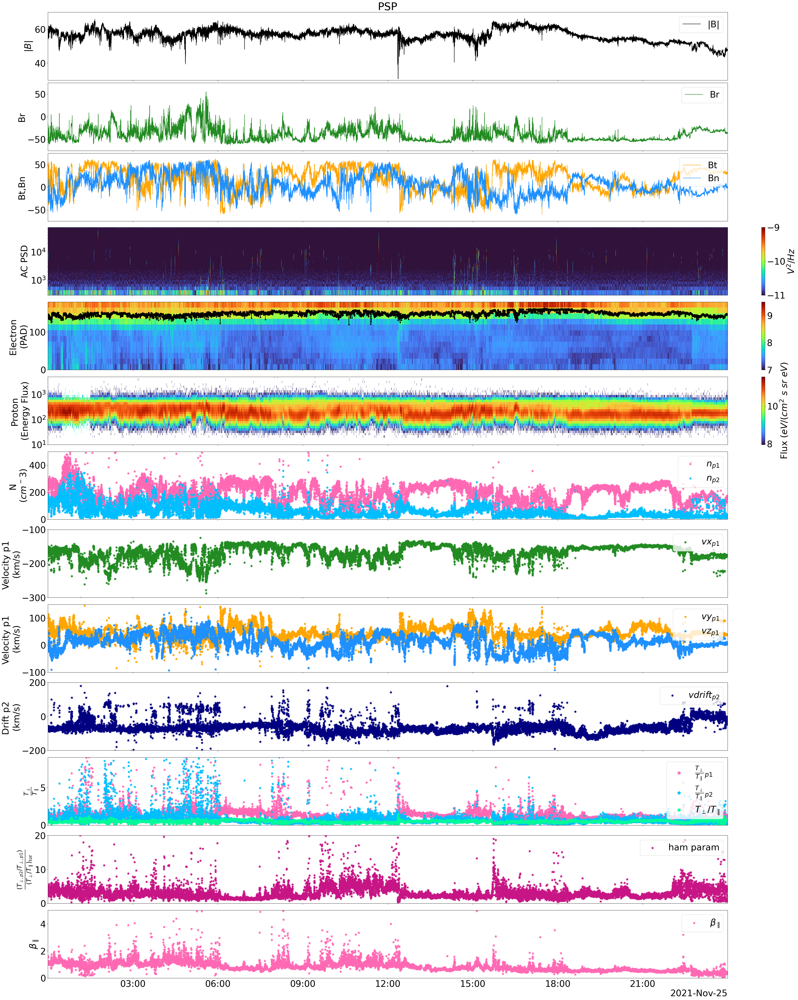

In [30]:
plt.rcParams.update({'font.size': 32})

fig, ax = plt.subplots(13, 1, sharex=True, figsize=(40, 50),layout='compressed')
s=75
alpha=1
ax[0].plot(time_datetime(br.times),bmag_rtn4sa, label = '|B|', color='k')
ax[1].plot(time_datetime(br.times),br.y, label = 'Br', color='forestgreen')
ax[2].plot(time_datetime(br.times),bt.y, label = 'Bt', color='orange')
ax[2].plot(time_datetime(br.times),bn.y, label = 'Bn', color='dodgerblue')

s0=ax[3].pcolormesh(times_ac_repeat,ac_freq_vals,
         np.log10(ac_vals),cmap='turbo',vmin = -11, vmax = -9)
cbar0 = plt.colorbar(s0,label=f'$V^2/Hz$')

s1=ax[4].pcolormesh(times_spe_repeat,epad_PA_vals,
         np.log10(epad_strahl),cmap='turbo', vmin = 7, vmax = 9.5)
cbar = plt.colorbar(s1)
ax[4].plot(datetime_spe,centroids_epad,color='black', linestyle='-', marker='o', markersize=4)
s2 = ax[5].pcolormesh(times_spi_repeat,spi_nrg_vals,
         np.log10(spi_nrg_flux),cmap='turbo')
cbar2 = plt.colorbar(s2,label=f'Flux ($eV/(cm^2 \\ s \\ sr \\ eV)$')
ax[6].scatter(df_sf00['datetime'], df_sf00['np1'], label = '$n_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['np2'], label = '$n_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[7].scatter(df_sf00['datetime'], df_sf00['vp1_x'], label = '$vx_{p1}$', color = 'forestgreen', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['vp1_y'], label = '$vy_{p1}$', color = 'orange', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['vp1_z'], label = '$vz_{p1}$', color = 'dodgerblue', marker=(5,1), s=s, alpha=alpha)
ax[9].scatter(df_sf00['datetime'], df_sf00['vdrift'], label = '$vdrift_{p2}$', color = 'navy', marker=(5,1), s=s, alpha=alpha)
ax[10].scatter(df_sf00['datetime'], df_sf00['Trat1'], label = r'$\frac{T_\perp}{T_\parallel}_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[10].scatter(df_sf00['datetime'], df_sf00['Trat2'], label = r'$\frac{T_\perp}{T_\parallel}_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[10].scatter(df_sf00['datetime'], df_sf00['Trat_tot'], label = r'$T_\perp/T_\parallel$', color = 'mediumspringgreen', marker=(5,1), s=s, alpha=alpha)
ax[11].scatter(df_sf00['datetime'], df_sf00['ham_param'], label = r'ham param', color = 'mediumvioletred', marker=(5,1), s=s, alpha=alpha)
ax[12].scatter(df_sf00['datetime'], df_sf00['beta_ppar_qtn'], label = r'$\beta_\parallel$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)

ax[0].set(
    title=f'PSP',
    ylabel=f'$|B|$',
    ylim = [30,70],
   # xlim = [datetime(2022, 9, 4, 8,20,0), datetime(2022, 9, 4, 8,40,0)]

)
ax[1].set(
    ylabel = f'Br',
    ylim = [-75,75]
)
ax[2].set(
    ylabel = f'Bt,Bn',
    ylim = [-75,75]
)
ax[3].set(
    ylabel = f'AC PSD'
)
ax[3].set_yscale('log')
ax[4].set(
    ylabel = f'Electron \n(PAD)'
    #ylim = [-500,500]
)
ax[5].set(
    ylabel = 'Proton \n(Energy Flux)',
    ylim = [10,5e3]
)
ax[5].set_yscale('log')

ax[6].set(
    ylabel=f'N \n($cm^{-3}$)',
    #ymin = np.min([np.nanpercentile(np1,.03), np.nanpercentile(np2,.03)]),
    #ymax = np.max([np.nanpercentile(np1,.99), np.nanpercentile(np2,99)]),
  #  ylim = [0,np.max([np.nanpercentile(np1,99.9), np.nanpercentile(np2,99.9)])],
    ylim = [0,500],
 #   xlim = [datetime(2021, 11, 21, 0,0,0), datetime(2021, 11, 21, 4,0,0)]
)
ax[7].set(
    ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
    ylim = [-300,-100]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
)
ax[8].set(
    ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
    ylim = [-100,150]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
)

ax[9].set(
    ylabel=f'Drift p2 \n(km/s)',
   # ymin = np.minnp.nanpercentile(vdrift,.03),
  #  ymax =np.nanpercentile(vdrift,.99),
   # ylim = [np.nanpercentile(vdrift,.02),np.nanpercentile(vdrift,99.98)]
    ylim = [-200,200]
)


ax[10].set(
    ylabel=r'$\frac{T_\perp}{T_\parallel}$',
   # ymin = np.min([np.nanpercentile(trat1,.03), np.nanpercentile(trat2,.03)]),
   # ymax = np.max([np.nanpercentile(trat1,.99), np.nanpercentile(trat2,99)]),
   # ylim = [0, np.max([np.nanpercentile(trat1,94), np.nanpercentile(trat2,94)])]
    ylim = [0,9]
)

ax[11].set(
    ylabel = r'$\frac{(T_{\perp,p2}/T_{\perp,p1})}{(T_\perp/T_\parallel)_{tot}}$',
    ylim = [0,20]
)

ax[12].set(
    ylabel = r'$\beta_\parallel$',
    ylim = [0,5]
)

ax[0].legend(loc = 'upper right')
ax[1].legend(loc = 'upper right')
ax[2].legend(loc = 'upper right')
#ax[5].legend(loc = 'upper right')
ax[6].legend(loc = 'upper right')
ax[7].legend(loc = 'upper right')
ax[8].legend(loc = 'upper right')
ax[9].legend(loc = 'upper right')
lgnd = ax[10].legend(loc = 'upper right')
lgnd.legendHandles[0]._sizes = [200]
lgnd.legendHandles[1]._sizes = [200]
lgnd.legendHandles[2]._sizes = [200]
ax[11].legend(loc = 'upper right')
ax[12].legend(loc = 'upper right')


#tname=f"{epoch_spi[tSliceIndex_start_spi].strftime('%y%m%d_%H%M%S')}"+'-'+f"{epoch_spi[tSliceIndex_stop_spi].strftime('%H%M%S')}"
#drname = '/home/jovyan/e8_figs/'
#fname = '_b_v_pad_pnrg_p_nlfr_tempanis.png'
#plt.savefig(drname+tname+fname)         
plt.show()

21-May-24 15:33:11: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:11: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:11: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:11: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:11: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:11: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:11: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:11: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:11: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:11: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:17: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:17: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:17: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:17: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:17: Substituting symbol \perp from STIXGeneral
21-May-24 15:33:17: Substituting symbol \perp from STIX

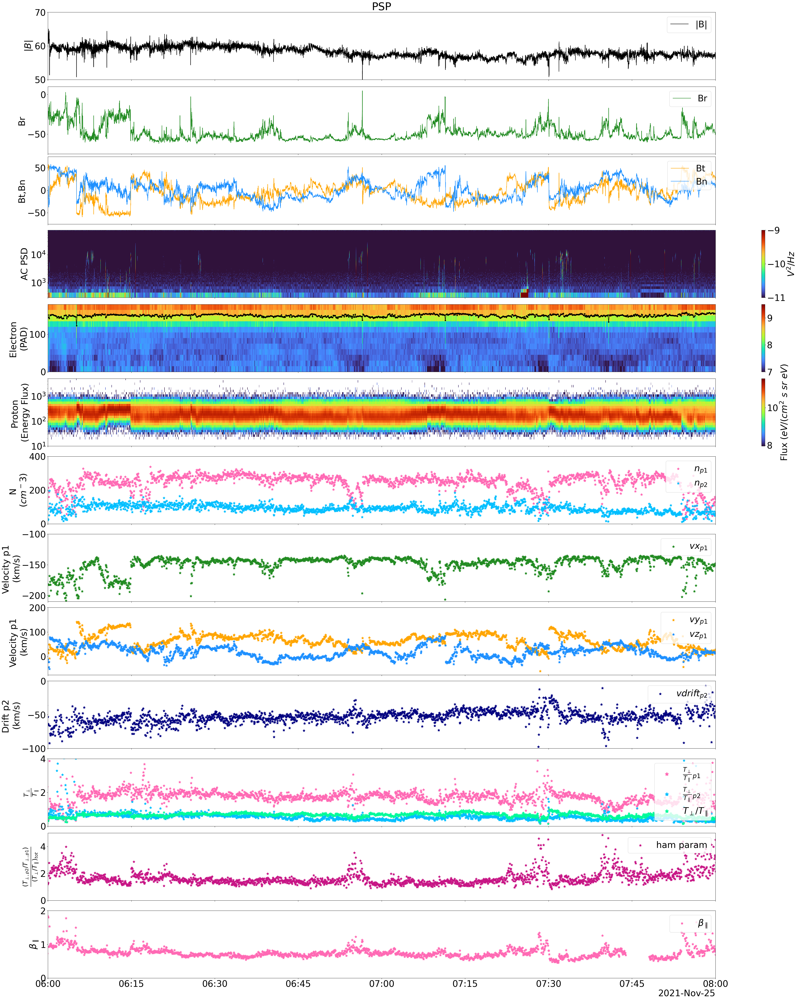

In [33]:
plt.rcParams.update({'font.size': 32})

fig, ax = plt.subplots(13, 1, sharex=True, figsize=(40, 50),layout='compressed')
s=75
alpha=1
ax[0].plot(time_datetime(br.times),bmag_rtn4sa, label = '|B|', color='k')
ax[1].plot(time_datetime(br.times),br.y, label = 'Br', color='forestgreen')
ax[2].plot(time_datetime(br.times),bt.y, label = 'Bt', color='orange')
ax[2].plot(time_datetime(br.times),bn.y, label = 'Bn', color='dodgerblue')

s0=ax[3].pcolormesh(times_ac_repeat,ac_freq_vals,
         np.log10(ac_vals),cmap='turbo',vmin = -11, vmax = -9)
cbar0 = plt.colorbar(s0,label=f'$V^2/Hz$')

s1=ax[4].pcolormesh(times_spe_repeat,epad_PA_vals,
         np.log10(epad_strahl),cmap='turbo', vmin = 7, vmax = 9.5)
cbar = plt.colorbar(s1)
ax[4].plot(datetime_spe,centroids_epad,color='black', linestyle='-', marker='o', markersize=4)
s2 = ax[5].pcolormesh(times_spi_repeat,spi_nrg_vals,
         np.log10(spi_nrg_flux),cmap='turbo')
cbar2 = plt.colorbar(s2,label=f'Flux ($eV/(cm^2 \\ s \\ sr \\ eV)$')
ax[6].scatter(df_sf00['datetime'], df_sf00['np1'], label = '$n_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['np2'], label = '$n_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[7].scatter(df_sf00['datetime'], df_sf00['vp1_x'], label = '$vx_{p1}$', color = 'forestgreen', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['vp1_y'], label = '$vy_{p1}$', color = 'orange', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['vp1_z'], label = '$vz_{p1}$', color = 'dodgerblue', marker=(5,1), s=s, alpha=alpha)
ax[9].scatter(df_sf00['datetime'], df_sf00['vdrift'], label = '$vdrift_{p2}$', color = 'navy', marker=(5,1), s=s, alpha=alpha)
ax[10].scatter(df_sf00['datetime'], df_sf00['Trat1'], label = r'$\frac{T_\perp}{T_\parallel}_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[10].scatter(df_sf00['datetime'], df_sf00['Trat2'], label = r'$\frac{T_\perp}{T_\parallel}_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[10].scatter(df_sf00['datetime'], df_sf00['Trat_tot'], label = r'$T_\perp/T_\parallel$', color = 'mediumspringgreen', marker=(5,1), s=s, alpha=alpha)
ax[11].scatter(df_sf00['datetime'], df_sf00['ham_param'], label = r'ham param', color = 'mediumvioletred', marker=(5,1), s=s, alpha=alpha)
ax[12].scatter(df_sf00['datetime'], df_sf00['beta_ppar_qtn'], label = r'$\beta_\parallel$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)

ax[0].set(
    title=f'PSP',
    ylabel=f'$|B|$',
    ylim = [50,70],
    xlim = [datetime(2021, 11, 25, 6,0,0), datetime(2021, 11, 25, 8,0,0)]

)
ax[1].set(
    ylabel = f'Br',
    ylim = [-75,10]
)
ax[2].set(
    ylabel = f'Bt,Bn',
    ylim = [-75,75]
)
ax[3].set(
    ylabel = f'AC PSD'
)
ax[3].set_yscale('log')
ax[4].set(
    ylabel = f'Electron \n(PAD)'
    #ylim = [-500,500]
)
ax[5].set(
    ylabel = 'Proton \n(Energy Flux)',
    ylim = [10,5e3]
)
ax[5].set_yscale('log')

ax[6].set(
    ylabel=f'N \n($cm^{-3}$)',
    #ymin = np.min([np.nanpercentile(np1,.03), np.nanpercentile(np2,.03)]),
    #ymax = np.max([np.nanpercentile(np1,.99), np.nanpercentile(np2,99)]),
  #  ylim = [0,np.max([np.nanpercentile(np1,99.9), np.nanpercentile(np2,99.9)])],
    ylim = [0,400],
 #   xlim = [datetime(2021, 11, 21, 0,0,0), datetime(2021, 11, 21, 4,0,0)]
)
ax[7].set(
    ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
    ylim = [-210,-100]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
)
ax[8].set(
    ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
    ylim = [-75,200]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
)

ax[9].set(
    ylabel=f'Drift p2 \n(km/s)',
   # ymin = np.minnp.nanpercentile(vdrift,.03),
  #  ymax =np.nanpercentile(vdrift,.99),
   # ylim = [np.nanpercentile(vdrift,.02),np.nanpercentile(vdrift,99.98)]
    ylim = [-100,0]
)


ax[10].set(
    ylabel=r'$\frac{T_\perp}{T_\parallel}$',
   # ymin = np.min([np.nanpercentile(trat1,.03), np.nanpercentile(trat2,.03)]),
   # ymax = np.max([np.nanpercentile(trat1,.99), np.nanpercentile(trat2,99)]),
   # ylim = [0, np.max([np.nanpercentile(trat1,94), np.nanpercentile(trat2,94)])]
    ylim = [0,4]
)

ax[11].set(
    ylabel = r'$\frac{(T_{\perp,p2}/T_{\perp,p1})}{(T_\perp/T_\parallel)_{tot}}$',
    ylim = [0,5]
)

ax[12].set(
    ylabel = r'$\beta_\parallel$',
    ylim = [0,2]
)

ax[0].legend(loc = 'upper right')
ax[1].legend(loc = 'upper right')
ax[2].legend(loc = 'upper right')
#ax[5].legend(loc = 'upper right')
ax[6].legend(loc = 'upper right')
ax[7].legend(loc = 'upper right')
ax[8].legend(loc = 'upper right')
ax[9].legend(loc = 'upper right')
lgnd = ax[10].legend(loc = 'upper right')
lgnd.legendHandles[0]._sizes = [200]
lgnd.legendHandles[1]._sizes = [200]
lgnd.legendHandles[2]._sizes = [200]
ax[11].legend(loc = 'upper right')
ax[12].legend(loc = 'upper right')


#tname=f"{epoch_spi[tSliceIndex_start_spi].strftime('%y%m%d_%H%M%S')}"+'-'+f"{epoch_spi[tSliceIndex_stop_spi].strftime('%H%M%S')}"
#drname = '/home/jovyan/e8_figs/'
#fname = '_b_v_pad_pnrg_p_nlfr_tempanis.png'
#plt.savefig(drname+tname+fname)         
plt.show()

21-May-24 15:49:26: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:26: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:26: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:26: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:26: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:26: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:26: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:26: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:26: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:26: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:32: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:32: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:32: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:32: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:32: Substituting symbol \perp from STIXGeneral
21-May-24 15:49:32: Substituting symbol \perp from STIX

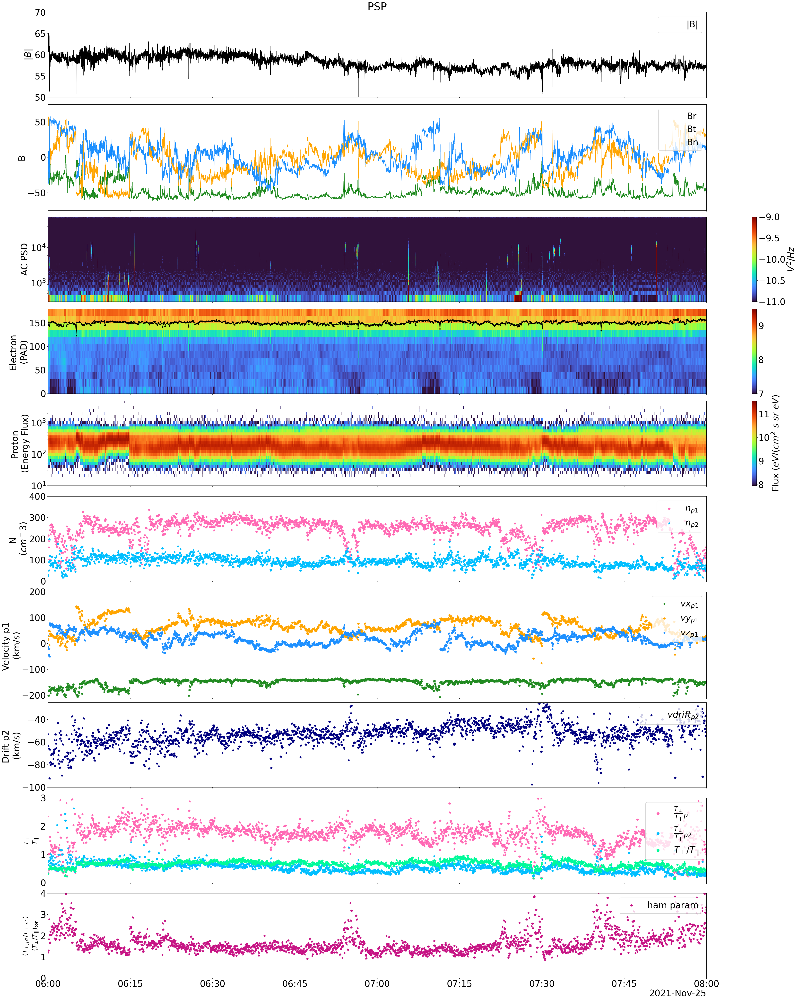

In [36]:
plt.rcParams.update({'font.size': 32})

fig, ax = plt.subplots(10, 1, sharex=True, figsize=(40, 50),layout='compressed', height_ratios = [1,1.25,1,1,1,1,1.25,1,1,1])
s=75
alpha=1
ax[0].plot(time_datetime(br.times),bmag_rtn4sa, label = '|B|', color='k')
ax[1].plot(time_datetime(br.times),br.y, label = 'Br', color='forestgreen')
ax[1].plot(time_datetime(br.times),bt.y, label = 'Bt', color='orange')
ax[1].plot(time_datetime(br.times),bn.y, label = 'Bn', color='dodgerblue')

s0=ax[2].pcolormesh(times_ac_repeat,ac_freq_vals,
         np.log10(ac_vals),cmap='turbo',vmin = -11, vmax = -9)
cbar0 = plt.colorbar(s0,label=f'$V^2/Hz$')

s1=ax[3].pcolormesh(times_spe_repeat,epad_PA_vals,
         np.log10(epad_strahl),cmap='turbo', vmin = 7, vmax = 9.5)
cbar = plt.colorbar(s1)
ax[3].plot(datetime_spe,centroids_epad,color='black', linestyle='-', marker='o', markersize=4)
s2 = ax[4].pcolormesh(times_spi_repeat,spi_nrg_vals,
         np.log10(spi_nrg_flux),cmap='turbo')
cbar2 = plt.colorbar(s2,label=f'Flux ($eV/(cm^2 \\ s \\ sr \\ eV)$')
ax[5].scatter(df_sf00['datetime'], df_sf00['np1'], label = '$n_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[5].scatter(df_sf00['datetime'], df_sf00['np2'], label = '$n_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['vp1_x'], label = '$vx_{p1}$', color = 'forestgreen', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['vp1_y'], label = '$vy_{p1}$', color = 'orange', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['vp1_z'], label = '$vz_{p1}$', color = 'dodgerblue', marker=(5,1), s=s, alpha=alpha)
ax[7].scatter(df_sf00['datetime'], df_sf00['vdrift'], label = '$vdrift_{p2}$', color = 'navy', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['Trat1'], label = r'$\frac{T_\perp}{T_\parallel}_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['Trat2'], label = r'$\frac{T_\perp}{T_\parallel}_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['Trat_tot'], label = r'$T_\perp/T_\parallel$', color = 'mediumspringgreen', marker=(5,1), s=s, alpha=alpha)
ax[9].scatter(df_sf00['datetime'], df_sf00['ham_param'], label = r'ham param', color = 'mediumvioletred', marker=(5,1), s=s, alpha=alpha)


ax[0].set(
    title=f'PSP',
    ylabel=f'$|B|$',
    ylim = [50,70],
    xlim = [datetime(2021, 11, 25, 6,0,0), datetime(2021, 11, 25, 8,0,0)]

)
ax[1].set(
    ylabel = f'B',
    ylim = [-75,75]
)
#ax[2].set(
  #  ylabel = f'Bt,Bn',
  #  ylim = [-75,75]
#)
ax[2].set(
    ylabel = f'AC PSD'
)
ax[2].set_yscale('log')
ax[3].set(
    ylabel = f'Electron \n(PAD)'
    #ylim = [-500,500]
)
ax[4].set(
    ylabel = 'Proton \n(Energy Flux)',
    ylim = [10,5e3]
)
ax[4].set_yscale('log')

ax[5].set(
    ylabel=f'N \n($cm^{-3}$)',
    #ymin = np.min([np.nanpercentile(np1,.03), np.nanpercentile(np2,.03)]),
    #ymax = np.max([np.nanpercentile(np1,.99), np.nanpercentile(np2,99)]),
  #  ylim = [0,np.max([np.nanpercentile(np1,99.9), np.nanpercentile(np2,99.9)])],
    ylim = [0,400],
 #   xlim = [datetime(2021, 11, 21, 0,0,0), datetime(2021, 11, 21, 4,0,0)]
)
ax[6].set(
    ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
    ylim = [-210,200]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
)
#ax[8].set(
 #   ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
  #  ylim = [-75,200]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
#)

ax[7].set(
    ylabel=f'Drift p2 \n(km/s)',
   # ymin = np.minnp.nanpercentile(vdrift,.03),
  #  ymax =np.nanpercentile(vdrift,.99),
   # ylim = [np.nanpercentile(vdrift,.02),np.nanpercentile(vdrift,99.98)]
    ylim = [-100,-25]
)


ax[8].set(
    ylabel=r'$\frac{T_\perp}{T_\parallel}$',
   # ymin = np.min([np.nanpercentile(trat1,.03), np.nanpercentile(trat2,.03)]),
   # ymax = np.max([np.nanpercentile(trat1,.99), np.nanpercentile(trat2,99)]),
   # ylim = [0, np.max([np.nanpercentile(trat1,94), np.nanpercentile(trat2,94)])]
    ylim = [0,3]
)

ax[9].set(
    ylabel = r'$\frac{(T_{\perp,p2}/T_{\perp,p1})}{(T_\perp/T_\parallel)_{tot}}$',
    ylim = [0,4]
)


ax[0].legend(loc = 'upper right')
ax[1].legend(loc = 'upper right')
#ax[2].legend(loc = 'upper right')
ax[5].legend(loc = 'upper right')
ax[6].legend(loc = 'upper right')
ax[7].legend(loc = 'upper right')
ax[8].legend(loc = 'upper right')
lgnd = ax[8].legend(loc = 'upper right')
lgnd.legendHandles[0]._sizes = [200]
lgnd.legendHandles[1]._sizes = [200]
lgnd.legendHandles[2]._sizes = [200]
ax[9].legend(loc = 'upper right')


#tname=f"{epoch_spi[tSliceIndex_start_spi].strftime('%y%m%d_%H%M%S')}"+'-'+f"{epoch_spi[tSliceIndex_stop_spi].strftime('%H%M%S')}"
#drname = '/home/jovyan/e8_figs/'
#fname = '_b_v_pad_pnrg_p_nlfr_tempanis.png'
#plt.savefig(drname+tname+fname)         
plt.show()

21-May-24 16:24:43: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:43: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:43: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:43: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:43: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:43: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:43: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:43: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:49: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:49: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:49: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:49: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:49: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:49: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:49: Substituting symbol \perp from STIXGeneral
21-May-24 16:24:49: Substituting symbol \perp from STIX

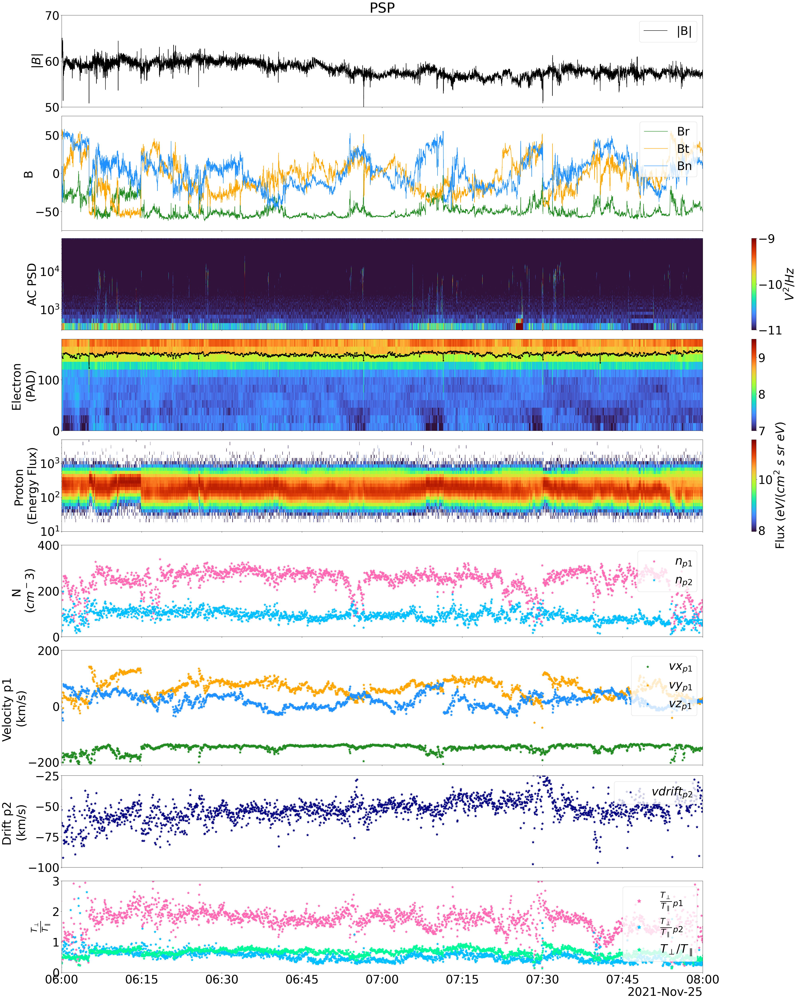

In [42]:
plt.rcParams.update({'font.size': 42})

fig, ax = plt.subplots(9, 1, sharex=True, figsize=(40, 50),layout='compressed', height_ratios = [1,1.25,1,1,1,1,1.25,1,1])
s=75
alpha=1
ax[0].plot(time_datetime(br.times),bmag_rtn4sa, label = '|B|', color='k')
ax[1].plot(time_datetime(br.times),br.y, label = 'Br', color='forestgreen')
ax[1].plot(time_datetime(br.times),bt.y, label = 'Bt', color='orange')
ax[1].plot(time_datetime(br.times),bn.y, label = 'Bn', color='dodgerblue')

s0=ax[2].pcolormesh(times_ac_repeat,ac_freq_vals,
         np.log10(ac_vals),cmap='turbo',vmin = -11, vmax = -9)
cbar0 = plt.colorbar(s0,label=f'$V^2/Hz$')

s1=ax[3].pcolormesh(times_spe_repeat,epad_PA_vals,
         np.log10(epad_strahl),cmap='turbo', vmin = 7, vmax = 9.5)
cbar = plt.colorbar(s1)
ax[3].plot(datetime_spe,centroids_epad,color='black', linestyle='-', marker='o', markersize=4)
s2 = ax[4].pcolormesh(times_spi_repeat,spi_nrg_vals,
         np.log10(spi_nrg_flux),cmap='turbo')
cbar2 = plt.colorbar(s2,label=f'Flux ($eV/(cm^2 \\ s \\ sr \\ eV)$')
ax[5].scatter(df_sf00['datetime'], df_sf00['np1'], label = '$n_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[5].scatter(df_sf00['datetime'], df_sf00['np2'], label = '$n_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['vp1_x'], label = '$vx_{p1}$', color = 'forestgreen', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['vp1_y'], label = '$vy_{p1}$', color = 'orange', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['vp1_z'], label = '$vz_{p1}$', color = 'dodgerblue', marker=(5,1), s=s, alpha=alpha)
ax[7].scatter(df_sf00['datetime'], df_sf00['vdrift'], label = '$vdrift_{p2}$', color = 'navy', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['Trat1'], label = r'$\frac{T_\perp}{T_\parallel}_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['Trat2'], label = r'$\frac{T_\perp}{T_\parallel}_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['Trat_tot'], label = r'$T_\perp/T_\parallel$', color = 'mediumspringgreen', marker=(5,1), s=s, alpha=alpha)

ax[0].set(
    title=f'PSP',
    ylabel=f'$|B|$',
    ylim = [50,70],
    xlim = [datetime(2021, 11, 25, 6,0,0), datetime(2021, 11, 25, 8,0,0)]

)
ax[1].set(
    ylabel = f'B',
    ylim = [-75,75]
)
#ax[2].set(
  #  ylabel = f'Bt,Bn',
  #  ylim = [-75,75]
#)
ax[2].set(
    ylabel = f'AC PSD'
)
ax[2].set_yscale('log')
ax[3].set(
    ylabel = f'Electron \n(PAD)'
    #ylim = [-500,500]
)
ax[4].set(
    ylabel = 'Proton \n(Energy Flux)',
    ylim = [10,5e3]
)
ax[4].set_yscale('log')

ax[5].set(
    ylabel=f'N \n($cm^{-3}$)',
    #ymin = np.min([np.nanpercentile(np1,.03), np.nanpercentile(np2,.03)]),
    #ymax = np.max([np.nanpercentile(np1,.99), np.nanpercentile(np2,99)]),
  #  ylim = [0,np.max([np.nanpercentile(np1,99.9), np.nanpercentile(np2,99.9)])],
    ylim = [0,400],
 #   xlim = [datetime(2021, 11, 21, 0,0,0), datetime(2021, 11, 21, 4,0,0)]
)
ax[6].set(
    ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
    ylim = [-210,200]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
)
#ax[8].set(
 #   ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
  #  ylim = [-75,200]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
#)

ax[7].set(
    ylabel=f'Drift p2 \n(km/s)',
   # ymin = np.minnp.nanpercentile(vdrift,.03),
  #  ymax =np.nanpercentile(vdrift,.99),
   # ylim = [np.nanpercentile(vdrift,.02),np.nanpercentile(vdrift,99.98)]
    ylim = [-100,-25]
)


ax[8].set(
    ylabel=r'$\frac{T_\perp}{T_\parallel}$',
   # ymin = np.min([np.nanpercentile(trat1,.03), np.nanpercentile(trat2,.03)]),
   # ymax = np.max([np.nanpercentile(trat1,.99), np.nanpercentile(trat2,99)]),
   # ylim = [0, np.max([np.nanpercentile(trat1,94), np.nanpercentile(trat2,94)])]
    ylim = [0,3]
)


ax[0].legend(loc = 'upper right')
ax[1].legend(loc = 'upper right')
#ax[2].legend(loc = 'upper right')
ax[5].legend(loc = 'upper right')
ax[6].legend(loc = 'upper right')
ax[7].legend(loc = 'upper right')
ax[8].legend(loc = 'upper right')
lgnd = ax[8].legend(loc = 'upper right')
lgnd.legendHandles[0]._sizes = [200]
lgnd.legendHandles[1]._sizes = [200]
lgnd.legendHandles[2]._sizes = [200]


#tname=f"{epoch_spi[tSliceIndex_start_spi].strftime('%y%m%d_%H%M%S')}"+'-'+f"{epoch_spi[tSliceIndex_stop_spi].strftime('%H%M%S')}"
#drname = '/home/jovyan/e8_figs/'
#fname = '_b_v_pad_pnrg_p_nlfr_tempanis.png'
#plt.savefig(drname+tname+fname)         
plt.show()

21-May-24 16:23:06: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:06: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:06: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:06: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:06: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:06: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:06: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:06: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:11: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:11: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:11: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:11: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:11: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:11: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:11: Substituting symbol \perp from STIXGeneral
21-May-24 16:23:11: Substituting symbol \perp from STIX

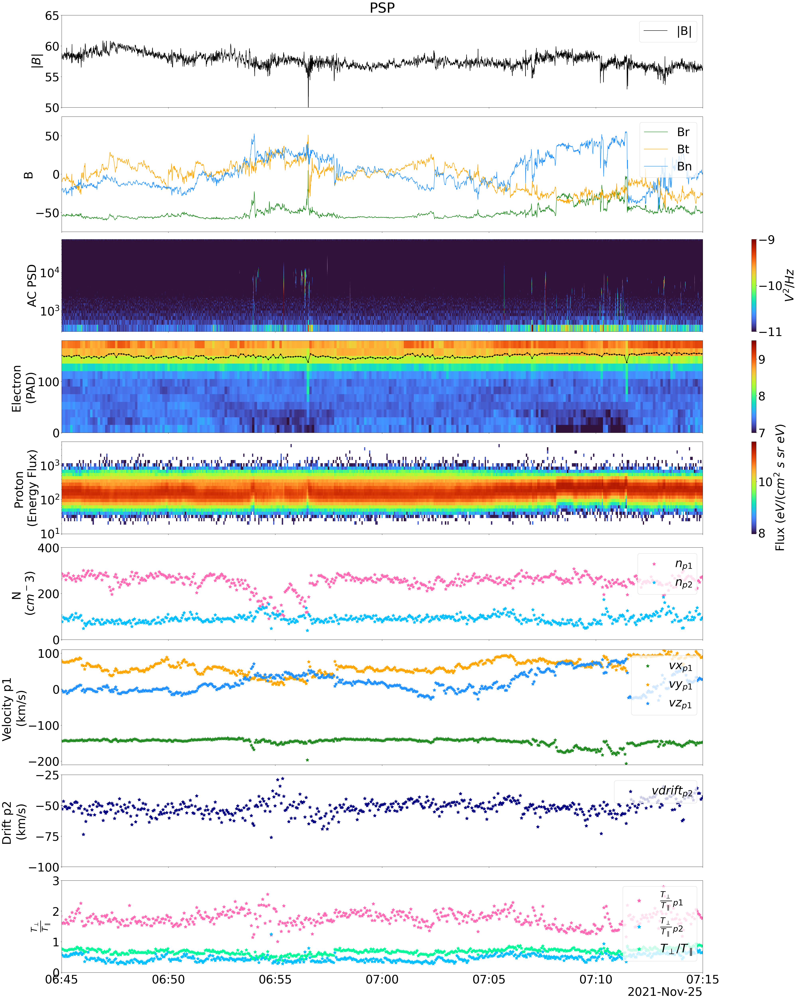

In [41]:
plt.rcParams.update({'font.size': 42})

fig, ax = plt.subplots(9, 1, sharex=True, figsize=(40, 50),layout='compressed', height_ratios = [1,1.25,1,1,1,1,1.25,1,1])
s=150
alpha=1
ax[0].plot(time_datetime(br.times),bmag_rtn4sa, label = '|B|', color='k')
ax[1].plot(time_datetime(br.times),br.y, label = 'Br', color='forestgreen')
ax[1].plot(time_datetime(br.times),bt.y, label = 'Bt', color='orange')
ax[1].plot(time_datetime(br.times),bn.y, label = 'Bn', color='dodgerblue')

s0=ax[2].pcolormesh(times_ac_repeat,ac_freq_vals,
         np.log10(ac_vals),cmap='turbo',vmin = -11, vmax = -9)
cbar0 = plt.colorbar(s0,label=f'$V^2/Hz$')

s1=ax[3].pcolormesh(times_spe_repeat,epad_PA_vals,
         np.log10(epad_strahl),cmap='turbo', vmin = 7, vmax = 9.5)
cbar = plt.colorbar(s1)
ax[3].plot(datetime_spe,centroids_epad,color='black', linestyle='-', marker='o', markersize=4)
s2 = ax[4].pcolormesh(times_spi_repeat,spi_nrg_vals,
         np.log10(spi_nrg_flux),cmap='turbo')
cbar2 = plt.colorbar(s2,label=f'Flux ($eV/(cm^2 \\ s \\ sr \\ eV)$')
ax[5].scatter(df_sf00['datetime'], df_sf00['np1'], label = '$n_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[5].scatter(df_sf00['datetime'], df_sf00['np2'], label = '$n_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['vp1_x'], label = '$vx_{p1}$', color = 'forestgreen', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['vp1_y'], label = '$vy_{p1}$', color = 'orange', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['vp1_z'], label = '$vz_{p1}$', color = 'dodgerblue', marker=(5,1), s=s, alpha=alpha)
ax[7].scatter(df_sf00['datetime'], df_sf00['vdrift'], label = '$vdrift_{p2}$', color = 'navy', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['Trat1'], label = r'$\frac{T_\perp}{T_\parallel}_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['Trat2'], label = r'$\frac{T_\perp}{T_\parallel}_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['Trat_tot'], label = r'$T_\perp/T_\parallel$', color = 'mediumspringgreen', marker=(5,1), s=s, alpha=alpha)

ax[0].set(
    title=f'PSP',
    ylabel=f'$|B|$',
    ylim = [50,65],
    xlim = [datetime(2021, 11, 25, 6,45,0), datetime(2021, 11, 25, 7,15,0)]

)
ax[1].set(
    ylabel = f'B',
    ylim = [-75,75]
)
#ax[2].set(
  #  ylabel = f'Bt,Bn',
  #  ylim = [-75,75]
#)
ax[2].set(
    ylabel = f'AC PSD'
)
ax[2].set_yscale('log')
ax[3].set(
    ylabel = f'Electron \n(PAD)'
    #ylim = [-500,500]
)
ax[4].set(
    ylabel = 'Proton \n(Energy Flux)',
    ylim = [10,5e3]
)
ax[4].set_yscale('log')

ax[5].set(
    ylabel=f'N \n($cm^{-3}$)',
    #ymin = np.min([np.nanpercentile(np1,.03), np.nanpercentile(np2,.03)]),
    #ymax = np.max([np.nanpercentile(np1,.99), np.nanpercentile(np2,99)]),
  #  ylim = [0,np.max([np.nanpercentile(np1,99.9), np.nanpercentile(np2,99.9)])],
    ylim = [0,400],
 #   xlim = [datetime(2021, 11, 21, 0,0,0), datetime(2021, 11, 21, 4,0,0)]
)
ax[6].set(
    ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
    ylim = [-210,110]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
)
#ax[8].set(
 #   ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
  #  ylim = [-75,200]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
#)

ax[7].set(
    ylabel=f'Drift p2 \n(km/s)',
   # ymin = np.minnp.nanpercentile(vdrift,.03),
  #  ymax =np.nanpercentile(vdrift,.99),
   # ylim = [np.nanpercentile(vdrift,.02),np.nanpercentile(vdrift,99.98)]
    ylim = [-100,-25]
)


ax[8].set(
    ylabel=r'$\frac{T_\perp}{T_\parallel}$',
   # ymin = np.min([np.nanpercentile(trat1,.03), np.nanpercentile(trat2,.03)]),
   # ymax = np.max([np.nanpercentile(trat1,.99), np.nanpercentile(trat2,99)]),
   # ylim = [0, np.max([np.nanpercentile(trat1,94), np.nanpercentile(trat2,94)])]
    ylim = [0,3]
)


ax[0].legend(loc = 'upper right')
ax[1].legend(loc = 'upper right')
#ax[2].legend(loc = 'upper right')
ax[5].legend(loc = 'upper right')
ax[6].legend(loc = 'upper right')
ax[7].legend(loc = 'upper right')
ax[8].legend(loc = 'upper right')
lgnd = ax[8].legend(loc = 'upper right')
lgnd.legendHandles[0]._sizes = [200]
lgnd.legendHandles[1]._sizes = [200]
lgnd.legendHandles[2]._sizes = [200]


#tname=f"{epoch_spi[tSliceIndex_start_spi].strftime('%y%m%d_%H%M%S')}"+'-'+f"{epoch_spi[tSliceIndex_stop_spi].strftime('%H%M%S')}"
#drname = '/home/jovyan/e8_figs/'
#fname = '_b_v_pad_pnrg_p_nlfr_tempanis.png'
#plt.savefig(drname+tname+fname)         
plt.show()

In [ ]:
plt.rcParams.update({'font.size': 36})

fig, ax = plt.subplots(9, 1, sharex=True, figsize=(40, 50),layout='compressed', height_ratios = [1,1.25,1,1,1,1,1.25,1,1])
s=75
alpha=1
ax[0].plot(time_datetime(br.times),bmag_rtn4sa, label = '|B|', color='k')
ax[1].plot(time_datetime(br.times),br.y, label = 'Br', color='forestgreen')
ax[1].plot(time_datetime(br.times),bt.y, label = 'Bt', color='orange')
ax[1].plot(time_datetime(br.times),bn.y, label = 'Bn', color='dodgerblue')

s0=ax[2].pcolormesh(times_ac_repeat,ac_freq_vals,
         np.log10(ac_vals),cmap='turbo',vmin = -11, vmax = -9)
cbar0 = plt.colorbar(s0,label=f'$V^2/Hz$')

s1=ax[3].pcolormesh(times_spe_repeat,epad_PA_vals,
         np.log10(epad_strahl),cmap='turbo', vmin = 7, vmax = 9.5)
cbar = plt.colorbar(s1)
ax[3].plot(datetime_spe,centroids_epad,color='black', linestyle='-', marker='o', markersize=4)
s2 = ax[4].pcolormesh(times_spi_repeat,spi_nrg_vals,
         np.log10(spi_nrg_flux),cmap='turbo')
cbar2 = plt.colorbar(s2,label=f'Flux ($eV/(cm^2 \\ s \\ sr \\ eV)$')
ax[5].scatter(df_sf00['datetime'], df_sf00['np1'], label = '$n_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[5].scatter(df_sf00['datetime'], df_sf00['np2'], label = '$n_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['vp1_x'], label = '$vx_{p1}$', color = 'forestgreen', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['vp1_y'], label = '$vy_{p1}$', color = 'orange', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['vp1_z'], label = '$vz_{p1}$', color = 'dodgerblue', marker=(5,1), s=s, alpha=alpha)
ax[7].scatter(df_sf00['datetime'], df_sf00['vdrift'], label = '$vdrift_{p2}$', color = 'navy', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['Trat1'], label = r'$\frac{T_\perp}{T_\parallel}_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['Trat2'], label = r'$\frac{T_\perp}{T_\parallel}_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['Trat_tot'], label = r'$T_\perp/T_\parallel$', color = 'mediumspringgreen', marker=(5,1), s=s, alpha=alpha)

ax[0].set(
    title=f'PSP',
    ylabel=f'$|B|$',
    ylim = [50,70],
    xlim = [datetime(2021, 11, 25, 6,45,0), datetime(2021, 11, 25, 7,15,0)]

)
ax[1].set(
    ylabel = f'B',
    ylim = [-75,75]
)
#ax[2].set(
  #  ylabel = f'Bt,Bn',
  #  ylim = [-75,75]
#)
ax[2].set(
    ylabel = f'AC PSD'
)
ax[2].set_yscale('log')
ax[3].set(
    ylabel = f'Electron \n(PAD)'
    #ylim = [-500,500]
)
ax[4].set(
    ylabel = 'Proton \n(Energy Flux)',
    ylim = [10,5e3]
)
ax[4].set_yscale('log')

ax[5].set(
    ylabel=f'N \n($cm^{-3}$)',
    #ymin = np.min([np.nanpercentile(np1,.03), np.nanpercentile(np2,.03)]),
    #ymax = np.max([np.nanpercentile(np1,.99), np.nanpercentile(np2,99)]),
  #  ylim = [0,np.max([np.nanpercentile(np1,99.9), np.nanpercentile(np2,99.9)])],
    ylim = [0,400],
 #   xlim = [datetime(2021, 11, 21, 0,0,0), datetime(2021, 11, 21, 4,0,0)]
)
ax[6].set(
    ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
    ylim = [-210,200]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
)
#ax[8].set(
 #   ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
  #  ylim = [-75,200]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
#)

ax[7].set(
    ylabel=f'Drift p2 \n(km/s)',
   # ymin = np.minnp.nanpercentile(vdrift,.03),
  #  ymax =np.nanpercentile(vdrift,.99),
   # ylim = [np.nanpercentile(vdrift,.02),np.nanpercentile(vdrift,99.98)]
    ylim = [-100,-25]
)


ax[8].set(
    ylabel=r'$\frac{T_\perp}{T_\parallel}$',
   # ymin = np.min([np.nanpercentile(trat1,.03), np.nanpercentile(trat2,.03)]),
   # ymax = np.max([np.nanpercentile(trat1,.99), np.nanpercentile(trat2,99)]),
   # ylim = [0, np.max([np.nanpercentile(trat1,94), np.nanpercentile(trat2,94)])]
    ylim = [0,3]
)


ax[0].legend(loc = 'upper right')
ax[1].legend(loc = 'upper right')
#ax[2].legend(loc = 'upper right')
ax[5].legend(loc = 'upper right')
ax[6].legend(loc = 'upper right')
ax[7].legend(loc = 'upper right')
ax[8].legend(loc = 'upper right')
lgnd = ax[8].legend(loc = 'upper right')
lgnd.legendHandles[0]._sizes = [200]
lgnd.legendHandles[1]._sizes = [200]
lgnd.legendHandles[2]._sizes = [200]


#tname=f"{epoch_spi[tSliceIndex_start_spi].strftime('%y%m%d_%H%M%S')}"+'-'+f"{epoch_spi[tSliceIndex_stop_spi].strftime('%H%M%S')}"
#drname = '/home/jovyan/e8_figs/'
#fname = '_b_v_pad_pnrg_p_nlfr_tempanis.png'
#plt.savefig(drname+tname+fname)         
plt.show()

21-May-24 15:31:02: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:02: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:02: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:02: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:02: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:02: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:02: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:02: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:02: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:02: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:08: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:08: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:08: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:08: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:08: Substituting symbol \perp from STIXGeneral
21-May-24 15:31:08: Substituting symbol \perp from STIX

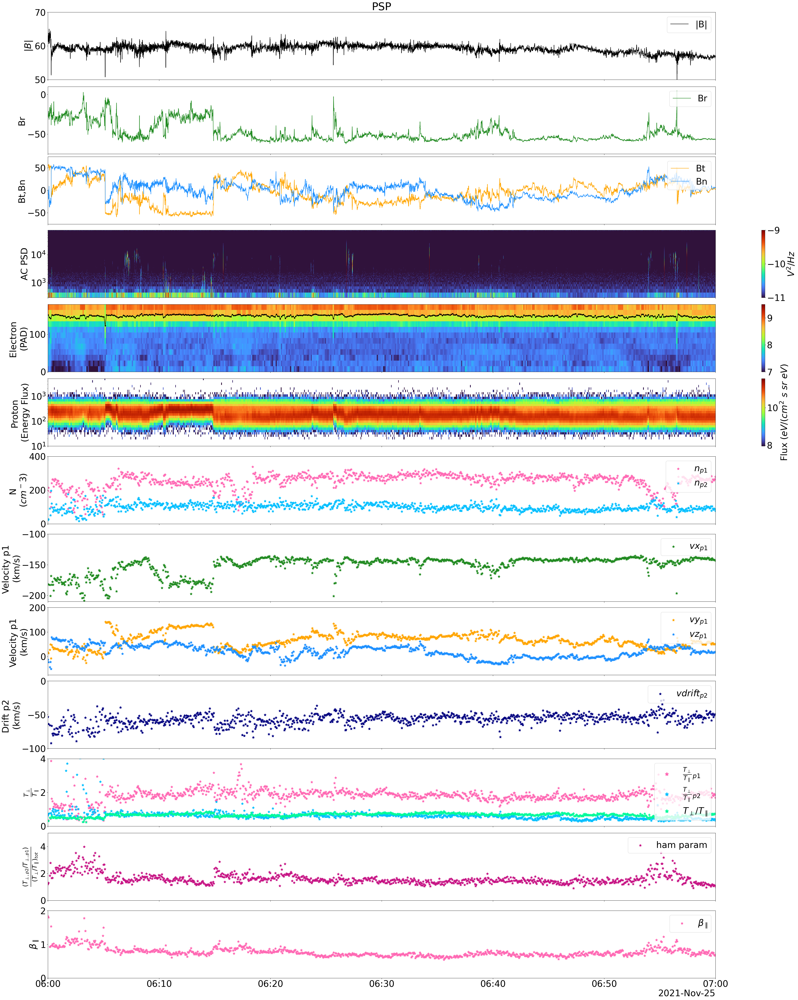

In [32]:
plt.rcParams.update({'font.size': 32})

fig, ax = plt.subplots(13, 1, sharex=True, figsize=(40, 50),layout='compressed')
s=75
alpha=1
ax[0].plot(time_datetime(br.times),bmag_rtn4sa, label = '|B|', color='k')
ax[1].plot(time_datetime(br.times),br.y, label = 'Br', color='forestgreen')
ax[2].plot(time_datetime(br.times),bt.y, label = 'Bt', color='orange')
ax[2].plot(time_datetime(br.times),bn.y, label = 'Bn', color='dodgerblue')

s0=ax[3].pcolormesh(times_ac_repeat,ac_freq_vals,
         np.log10(ac_vals),cmap='turbo',vmin = -11, vmax = -9)
cbar0 = plt.colorbar(s0,label=f'$V^2/Hz$')

s1=ax[4].pcolormesh(times_spe_repeat,epad_PA_vals,
         np.log10(epad_strahl),cmap='turbo', vmin = 7, vmax = 9.5)
cbar = plt.colorbar(s1)
ax[4].plot(datetime_spe,centroids_epad,color='black', linestyle='-', marker='o', markersize=4)
s2 = ax[5].pcolormesh(times_spi_repeat,spi_nrg_vals,
         np.log10(spi_nrg_flux),cmap='turbo')
cbar2 = plt.colorbar(s2,label=f'Flux ($eV/(cm^2 \\ s \\ sr \\ eV)$')
ax[6].scatter(df_sf00['datetime'], df_sf00['np1'], label = '$n_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[6].scatter(df_sf00['datetime'], df_sf00['np2'], label = '$n_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[7].scatter(df_sf00['datetime'], df_sf00['vp1_x'], label = '$vx_{p1}$', color = 'forestgreen', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['vp1_y'], label = '$vy_{p1}$', color = 'orange', marker=(5,1), s=s, alpha=alpha)
ax[8].scatter(df_sf00['datetime'], df_sf00['vp1_z'], label = '$vz_{p1}$', color = 'dodgerblue', marker=(5,1), s=s, alpha=alpha)
ax[9].scatter(df_sf00['datetime'], df_sf00['vdrift'], label = '$vdrift_{p2}$', color = 'navy', marker=(5,1), s=s, alpha=alpha)
ax[10].scatter(df_sf00['datetime'], df_sf00['Trat1'], label = r'$\frac{T_\perp}{T_\parallel}_{p1}$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)
ax[10].scatter(df_sf00['datetime'], df_sf00['Trat2'], label = r'$\frac{T_\perp}{T_\parallel}_{p2}$', color = 'deepskyblue', marker=(5,1), s=s, alpha=alpha)
ax[10].scatter(df_sf00['datetime'], df_sf00['Trat_tot'], label = r'$T_\perp/T_\parallel$', color = 'mediumspringgreen', marker=(5,1), s=s, alpha=alpha)
ax[11].scatter(df_sf00['datetime'], df_sf00['ham_param'], label = r'ham param', color = 'mediumvioletred', marker=(5,1), s=s, alpha=alpha)
ax[12].scatter(df_sf00['datetime'], df_sf00['beta_ppar_qtn'], label = r'$\beta_\parallel$', color = 'hotpink', marker=(5,1), s=s, alpha=alpha)

ax[0].set(
    title=f'PSP',
    ylabel=f'$|B|$',
    ylim = [50,70],
    xlim = [datetime(2021, 11, 25, 6,0,0), datetime(2021, 11, 25, 7,0,0)]

)
ax[1].set(
    ylabel = f'Br',
    ylim = [-75,10]
)
ax[2].set(
    ylabel = f'Bt,Bn',
    ylim = [-75,75]
)
ax[3].set(
    ylabel = f'AC PSD'
)
ax[3].set_yscale('log')
ax[4].set(
    ylabel = f'Electron \n(PAD)'
    #ylim = [-500,500]
)
ax[5].set(
    ylabel = 'Proton \n(Energy Flux)',
    ylim = [10,5e3]
)
ax[5].set_yscale('log')

ax[6].set(
    ylabel=f'N \n($cm^{-3}$)',
    #ymin = np.min([np.nanpercentile(np1,.03), np.nanpercentile(np2,.03)]),
    #ymax = np.max([np.nanpercentile(np1,.99), np.nanpercentile(np2,99)]),
  #  ylim = [0,np.max([np.nanpercentile(np1,99.9), np.nanpercentile(np2,99.9)])],
    ylim = [0,400],
 #   xlim = [datetime(2021, 11, 21, 0,0,0), datetime(2021, 11, 21, 4,0,0)]
)
ax[7].set(
    ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
    ylim = [-210,-100]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
)
ax[8].set(
    ylabel=f'Velocity p1 \n(km/s)',
   # ymin = np.min([np.nanpercentile(vp1_x,.03), np.nanpercentile(vp1_y,.03),np.nanpercentile(vp1_z,.03)]),
  #  ymax = np.max([np.nanpercentile(vp1_x,.99), np.nanpercentile(vp1_y,99), np.nanpercentile(vp1_z,.03)]),
    ylim = [-75,200]
   # ylim = [np.min([np.nanpercentile(vp1_x,.01), np.nanpercentile(vp1_y,.01),np.nanpercentile(vp1_z,.03)]),np.max([np.nanpercentile(vp1_x,99.95), np.nanpercentile(vp1_y,99.95), np.nanpercentile(vp1_z,99.95)])]
)

ax[9].set(
    ylabel=f'Drift p2 \n(km/s)',
   # ymin = np.minnp.nanpercentile(vdrift,.03),
  #  ymax =np.nanpercentile(vdrift,.99),
   # ylim = [np.nanpercentile(vdrift,.02),np.nanpercentile(vdrift,99.98)]
    ylim = [-100,0]
)


ax[10].set(
    ylabel=r'$\frac{T_\perp}{T_\parallel}$',
   # ymin = np.min([np.nanpercentile(trat1,.03), np.nanpercentile(trat2,.03)]),
   # ymax = np.max([np.nanpercentile(trat1,.99), np.nanpercentile(trat2,99)]),
   # ylim = [0, np.max([np.nanpercentile(trat1,94), np.nanpercentile(trat2,94)])]
    ylim = [0,4]
)

ax[11].set(
    ylabel = r'$\frac{(T_{\perp,p2}/T_{\perp,p1})}{(T_\perp/T_\parallel)_{tot}}$',
    ylim = [0,5]
)

ax[12].set(
    ylabel = r'$\beta_\parallel$',
    ylim = [0,2]
)

ax[0].legend(loc = 'upper right')
ax[1].legend(loc = 'upper right')
ax[2].legend(loc = 'upper right')
#ax[5].legend(loc = 'upper right')
ax[6].legend(loc = 'upper right')
ax[7].legend(loc = 'upper right')
ax[8].legend(loc = 'upper right')
ax[9].legend(loc = 'upper right')
lgnd = ax[10].legend(loc = 'upper right')
lgnd.legendHandles[0]._sizes = [200]
lgnd.legendHandles[1]._sizes = [200]
lgnd.legendHandles[2]._sizes = [200]
ax[11].legend(loc = 'upper right')
ax[12].legend(loc = 'upper right')


#tname=f"{epoch_spi[tSliceIndex_start_spi].strftime('%y%m%d_%H%M%S')}"+'-'+f"{epoch_spi[tSliceIndex_stop_spi].strftime('%H%M%S')}"
#drname = '/home/jovyan/e8_figs/'
#fname = '_b_v_pad_pnrg_p_nlfr_tempanis.png'
#plt.savefig(drname+tname+fname)         
plt.show()